In [1]:
from __future__ import print_function
import sys, os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

import ROOT
%jsroot on
from ROOT import gROOT, gStyle, gDirectory, gPad

from array import array

import constants
import crv_event
import crv_spill
import utils
import geometry
import geometry_constants
import filepath
import portROOT2pd

gROOT.Reset()
gROOT.SetBatch(1)
gROOT.ProcessLine( "gErrorIgnoreLevel = 1001;")
gStyle.SetOptStat(111110)
gStyle.SetOptFit(0)
gStyle.SetLineScalePS(0.3)

TARGET_OVERVOLTAGE = 3 # V
MV_PER_TRIM = -2. # mV/DAC
MV_PER_BULK = 20. # mV/DAC

topdir = os.path.dirname(os.path.abspath("__file__"))
settings_dir = os.path.join(topdir,"settings")

fileList = filepath.getfilelist(["bulk_scan_crvaging019"],"recoROOT",9)[0]
DeltaBulkNorm = filepath.datatag["bulk_scan_crvaging019"]["bulk"]
print(fileList)

nSmooth = 1 
tdict = {'*':[["temperatureCMB[0][0]","temperatureCMB[1][0]","temperatureCMB[2][0]",
               "temperatureCMB[3][0]","temperatureCMB[4][0]","temperatureCMB[5][0]",
               "temperatureCMB[6][0]","temperatureCMB[7][0]"],
              ["temperatureFEB[0:8]"]]}


Welcome to JupyROOT 6.28/10
['/pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-009-000/root/67/92/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-009-000.002093_000.root', '/pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-009-000/root/37/67/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-009-000.002094_000.root', '/pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-009-000/root/de/0d/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-009-000.002095_000.root', '/pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-009-000/root/3d/9d/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-009-000.002096_000.root', '/pnfs/mu2e/tape/phy-rec/rec/mu2e/CRV_wideband_cosmics/CRVWB-000-009-000/root/7e/75/rec.mu2e.CRV_wideband_cosmics.CRVWB-000-009-000.002097_000.root']


Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-009-000.002093_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-009-000.002094_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-009-000.002095_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-009-000.002096_000.root
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-009-000.002097_000.root


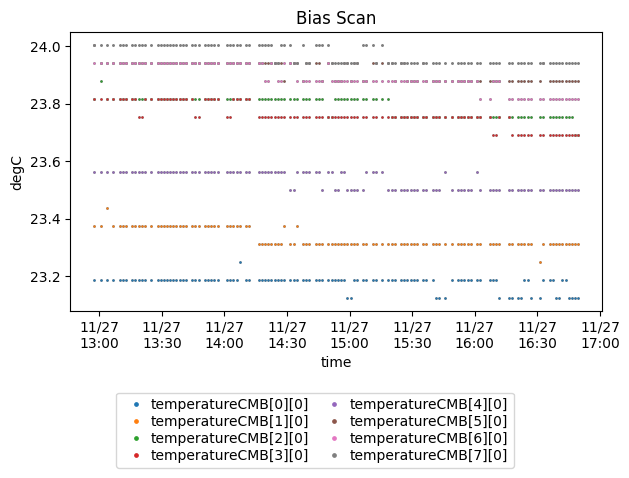

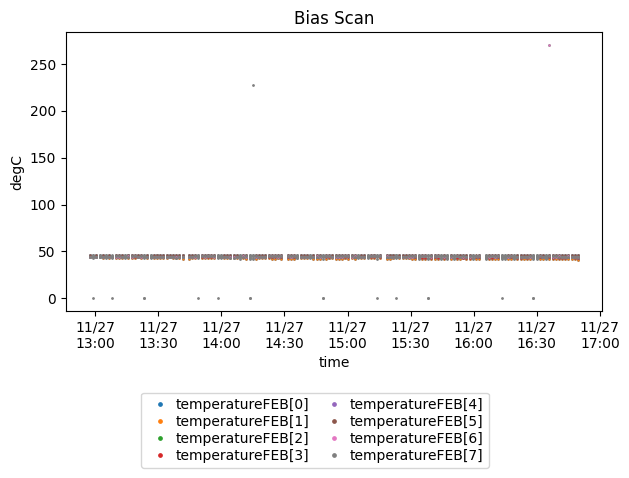

In [2]:
# tfig = utils.plot_dqm(fileList, tdict, '& 0xfffffffffffffe == 0x0', False, nSmooth, True, "Bias Scan;time;degC") 
tfig = utils.plot_dqm(fileList, tdict, ' == 0x0', False, nSmooth, True, "Bias Scan;time;degC") 

In [5]:
import pandas as pd
from scipy import stats
import settings_file

def PortToDFwithBulk(fileList, bulkList):
    df = portROOT2pd.PortToDF(fileList,{'bulkRelative':bulkList})
    return df

def CalibrateByScan(df0, targetVover = TARGET_OVERVOLTAGE, nr = 4, nc = 4, ifDrawCorr = True):
    FEBs = df0['FEB'].unique()
    FEBs = np.sort(FEBs)

    targetBulkOver = targetVover * 1000. / MV_PER_BULK

    df_calib = pd.DataFrame()

    maintitle = "calibration"
    xtitle = "Relative Bulk Settings [DAC unit]"
    ytitle = "SPE [ADC*ns/PE]"
     
    for FEB in FEBs:
        fig, axs = plt.subplots(nrows=nr, ncols=nc, figsize=(5*nc, 5*nr), sharey=True)
        plt.subplots_adjust(wspace=0)
        fig.subplots_adjust(top=0.24*nr/(0.04+0.24*nr))
        plt.suptitle(maintitle + ", FEB "+ str(FEB))
    
        for hdmi, ax in enumerate(axs.flatten()):
            ax.set_xlabel(xtitle)
            if(hdmi%4 == 0):
                ax.set_ylabel(ytitle)
            for inhdmi_chan in range(4):
                chan = hdmi*4+inhdmi_chan

                df0_ = df0.query("FEB==%i & ch==%i"%(FEB, chan)).reset_index()
                # display(df0_)
                x = df0_['bulkRelative']
                y1 = df0_['calibRaw']
                y2 = df0_['calibAdj']

                mask11 = ~np.isnan(y1) 
                mask12 = (y1!=0)
                mask1 = mask11 & mask12
                x1 = x[mask1]
                y1 = y1[mask1]

                if ifDrawCorr:
                    mask21 = ~np.isnan(y2) 
                    mask22 = (y2!=0)
                    mask2 = mask21 & mask22
                    x2 = x[mask2]
                    y2 = y2[mask2]

                bulkRelativeSetting1 = np.nan
                yref1 = np.nan
                bulkRelativeSetting2 = np.nan
                yref2 = np.nan

                # if len(x1)!=5:
                if len(x1)<3:
                    print(FEB, chan, list(df0_['bulkRelative']), list(df0_['calibRaw']), list(df0_['calibAdj']))
                    
                if len(x1)>1:
                    slope1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(x1.astype(float), y1.astype(float))
                    xintercept1 = - intercept1 / slope1
                    bulkRelativeSetting1 = round(xintercept1 + targetBulkOver, 1)
                    yref1 = bulkRelativeSetting1 * slope1 + intercept1
                
                    markers1 = ax.plot(x1, y1, 'o', label='Chan: %d raw, y = %.1f + %.1f * x, (%.1f, %.1f)'%(chan, intercept1, slope1, bulkRelativeSetting1, yref1))
                    ax.plot(x1, slope1 * x1 + intercept1, '--', color = markers1[0].get_color(), linewidth=0.7)
    
                if ifDrawCorr and len(x2) > 1:
                    slope2, intercept2, r_value2, p_value2, std_err2 = stats.linregress(x2.astype(float), y2.astype(float))
                    xintercept2 = - intercept2 / slope2
                    bulkRelativeSetting2 = round(xintercept2 + targetBulkOver, 1)
                    yref2 = bulkRelativeSetting2 * slope2 + intercept2

                    markers2 = ax.plot(x2, y2, 'v', label='Chan: %d corr., y = %.1f + %.1f * x, (%.1f, %.1f)'%(chan, intercept2, slope2, bulkRelativeSetting2, yref2), color = markers1[0].get_color())
                    ax.plot(x2, slope2 * x2 + intercept2, ':', color = markers1[0].get_color(), linewidth=0.7)

                ax.legend(fontsize='small')

                df_calib_ = pd.DataFrame()
                df_calib_['FEB'] = [FEB]
                df_calib_['ch'] = [chan]
                df_calib_['bulkRelativeSettingRaw'] = [bulkRelativeSetting1]
                df_calib_['SPErefRaw'] = [yref1]
                if ifDrawCorr:
                    df_calib_['bulkRelativeSettingCorr'] = [bulkRelativeSetting2]
                    df_calib_['SPErefCorr'] = [yref2]
                
                df_calib = pd.concat([df_calib,df_calib_], ignore_index=True)

    return df_calib   

4 0 [-25, 0, 25, 50, 75] [0.0, 0.0, 229.41700744628906, 275.9280090332031, 0.0] [0.0, 0.0, 258.3299865722656, 0.0, 0.0]
4 1 [-25, 0, 25, 50, 75] [0.0, 0.0, 236.72900390625, 283.8420104980469, 0.0] [0.0, 206.468994140625, 265.4840087890625, 0.0, 348.8429870605469]
4 2 [-25, 0, 25, 50, 75] [0.0, 0.0, 224.7100067138672, 0.0, 325.04400634765625] [0.0, 0.0, 251.88699340820312, 0.0, 345.0350036621094]
4 47 [-25, 0, 25, 50, 75] [0.0, 0.0, 0.0, 0.0, 0.0] [0.0, 0.0, 0.0, 0.0, 0.0]


,FEB,ch,bulkRelativeSettingRaw,SPErefRaw,bulkRelativeSettingCorr,SPErefCorr
0,0,0,35.8,347.923709,33.3,364.276065
1,0,1,36.0,342.565215,39.6,372.254650
2,0,2,32.7,345.973541,28.6,358.459124
3,0,3,39.3,365.113721,25.4,356.637413
4,0,4,38.4,380.449565,23.1,368.107633
...,...,...,...,...,...,...
507,7,59,12.1,382.336410,-0.1,381.558393
508,7,60,17.8,391.510673,5.4,389.501018
509,7,61,13.7,381.761400,1.4,380.582344
510,7,62,10.1,395.256951,-1.4,394.851281


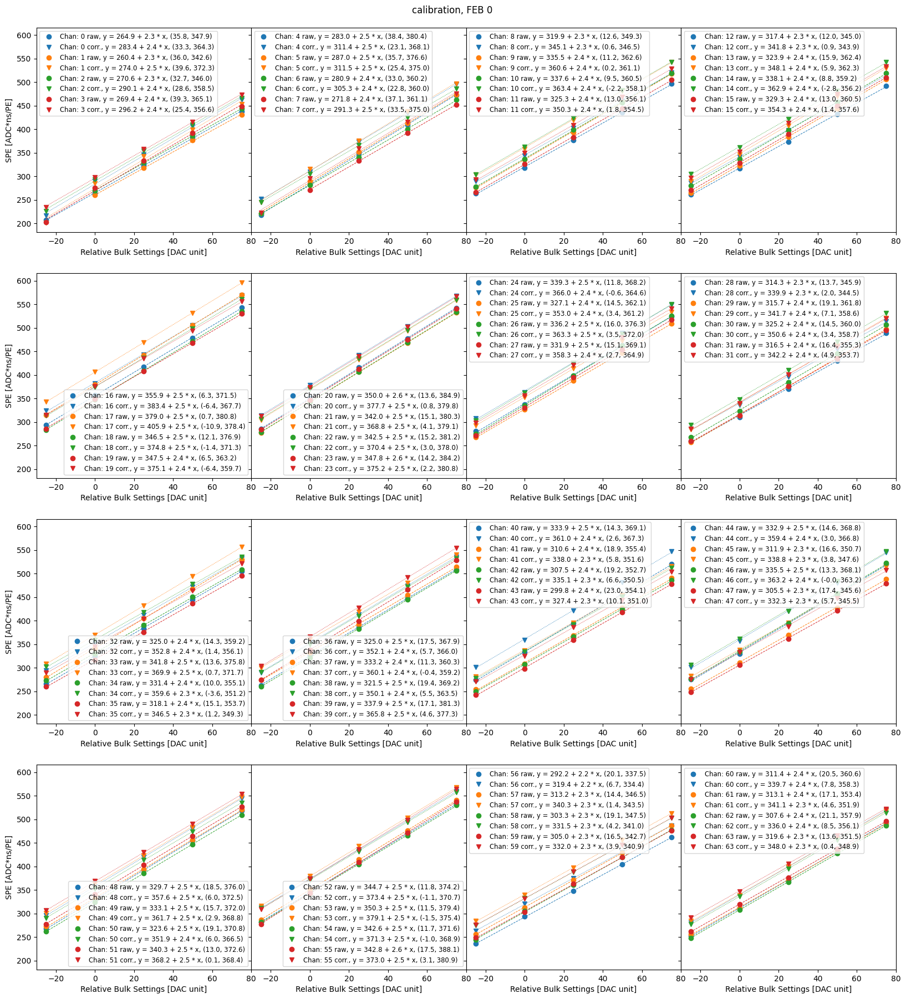

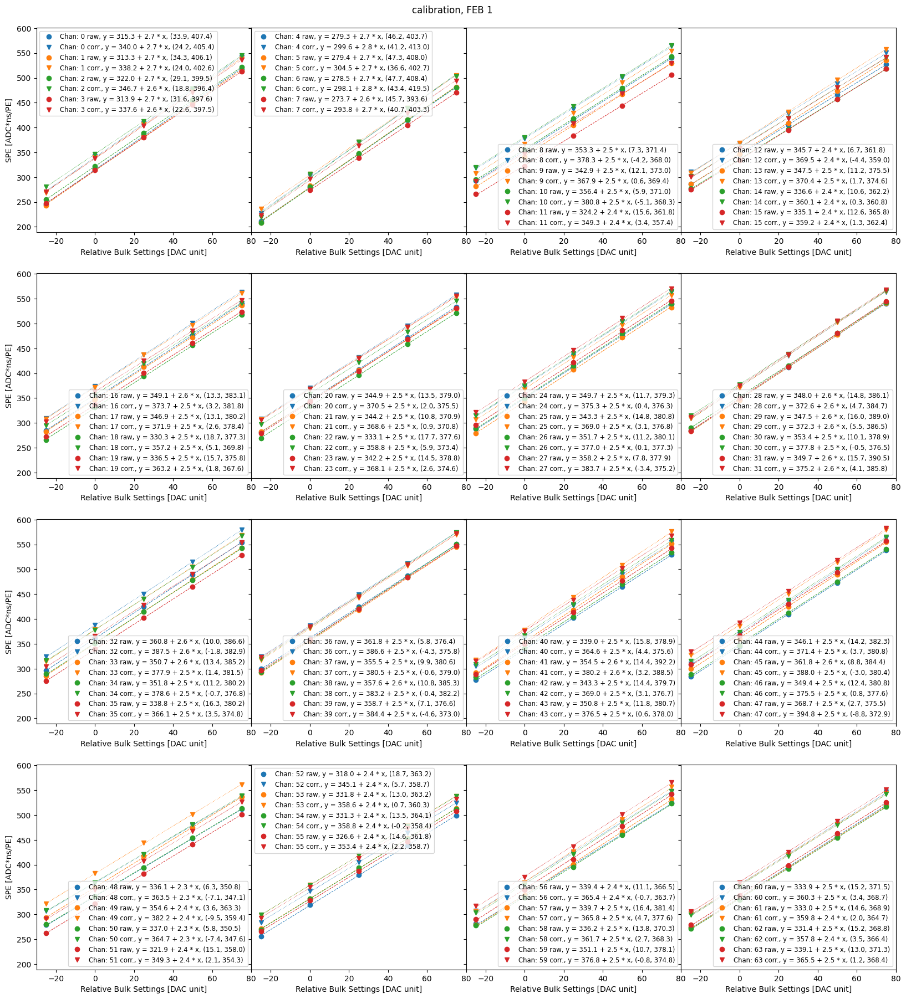

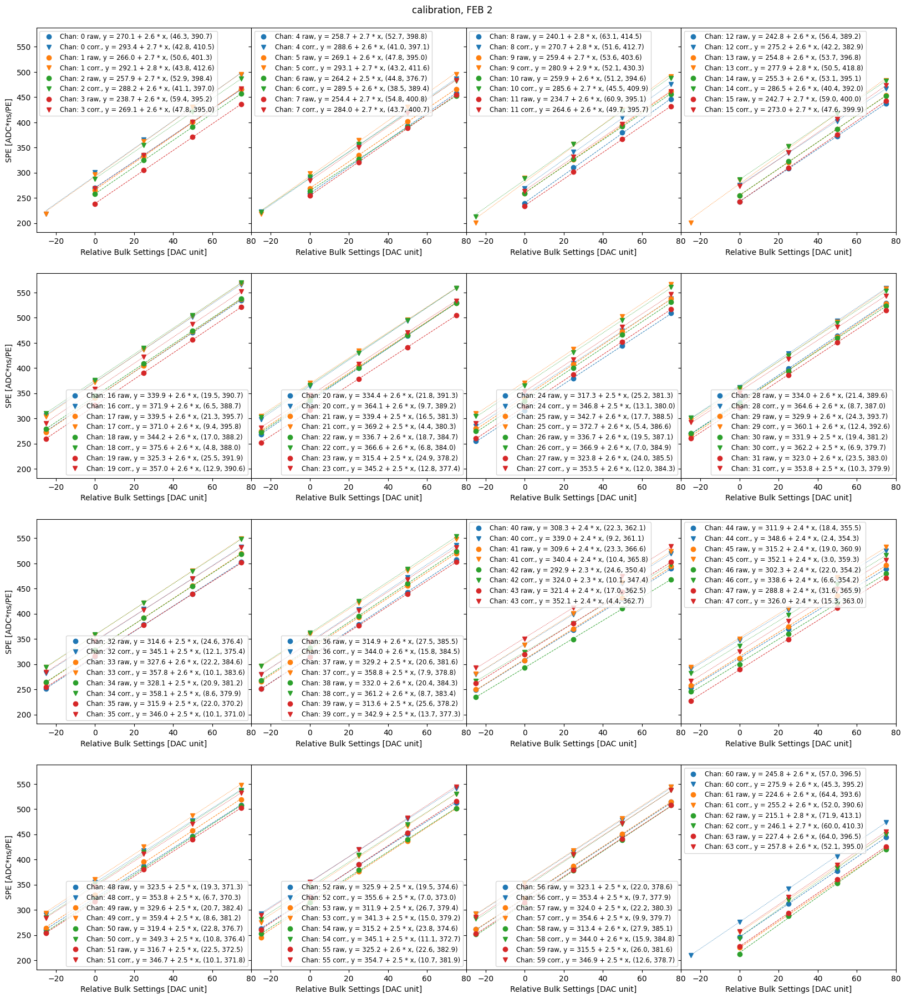

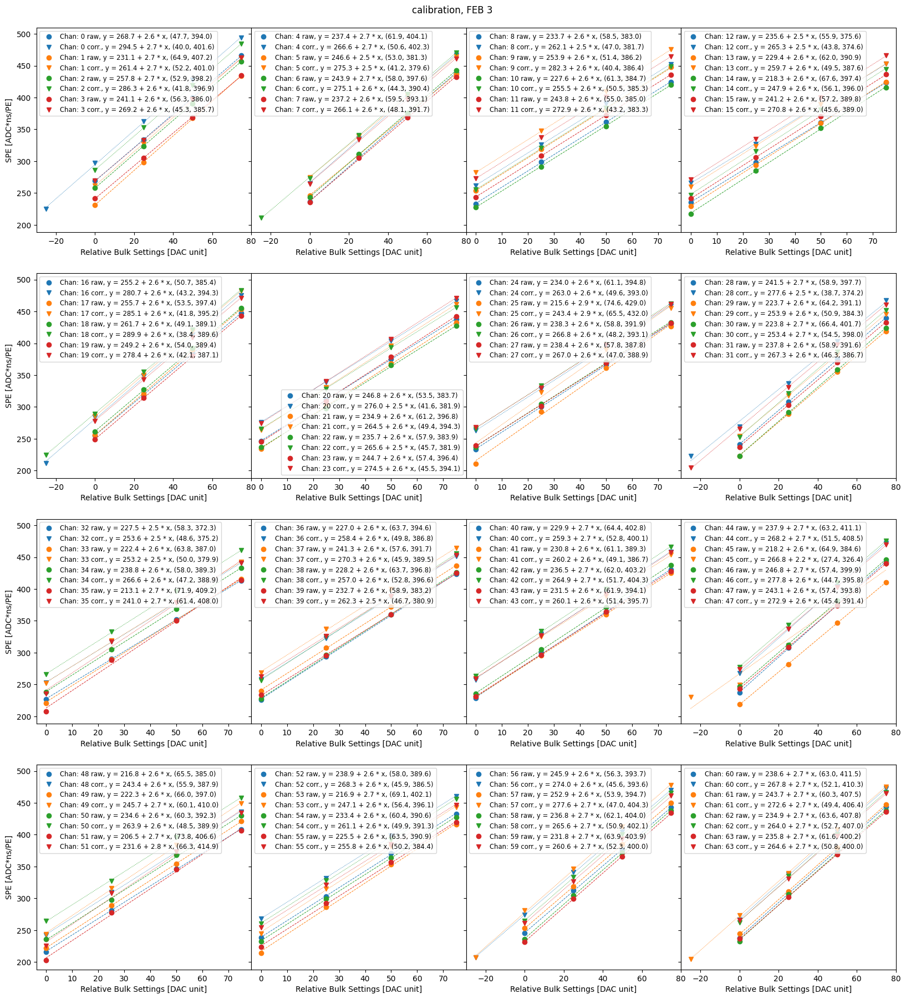

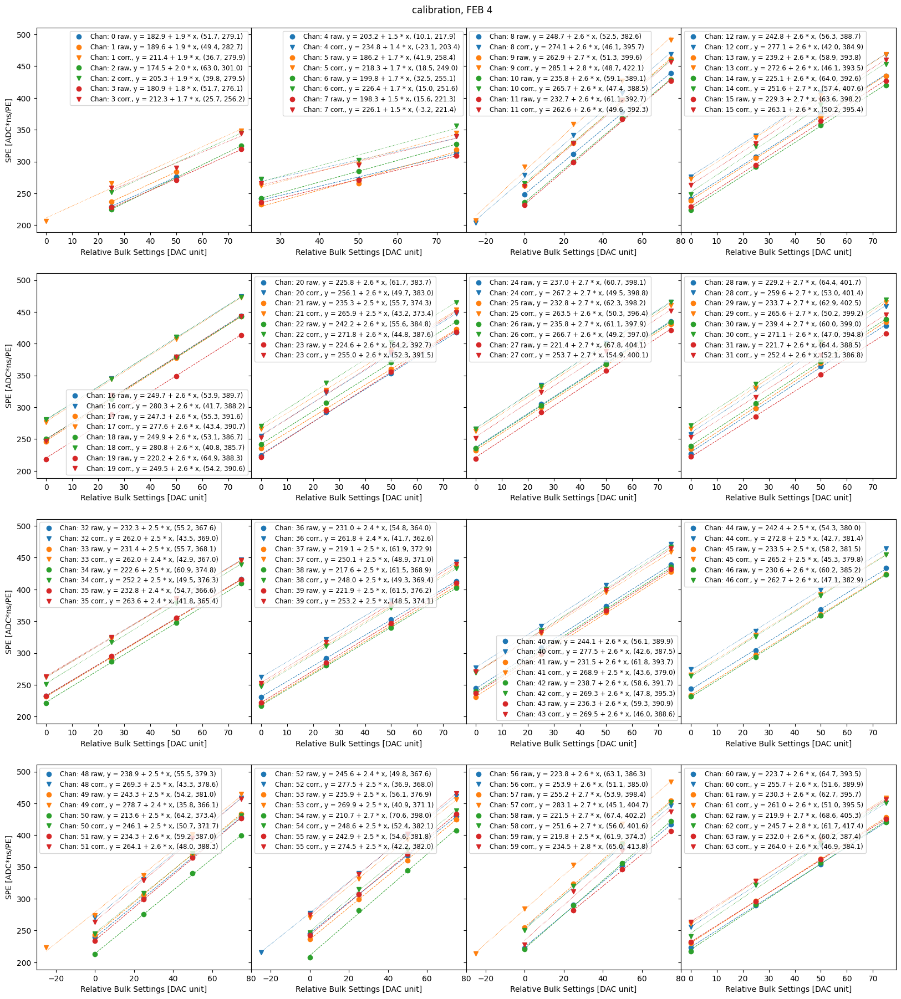

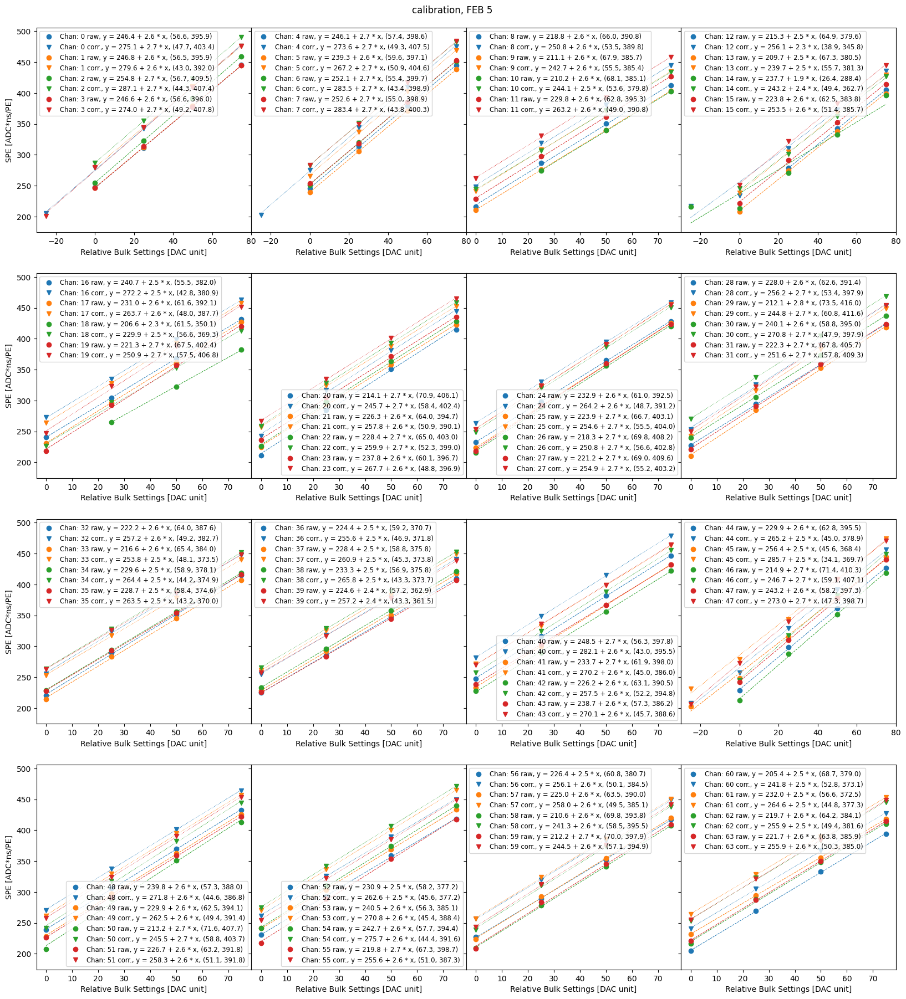

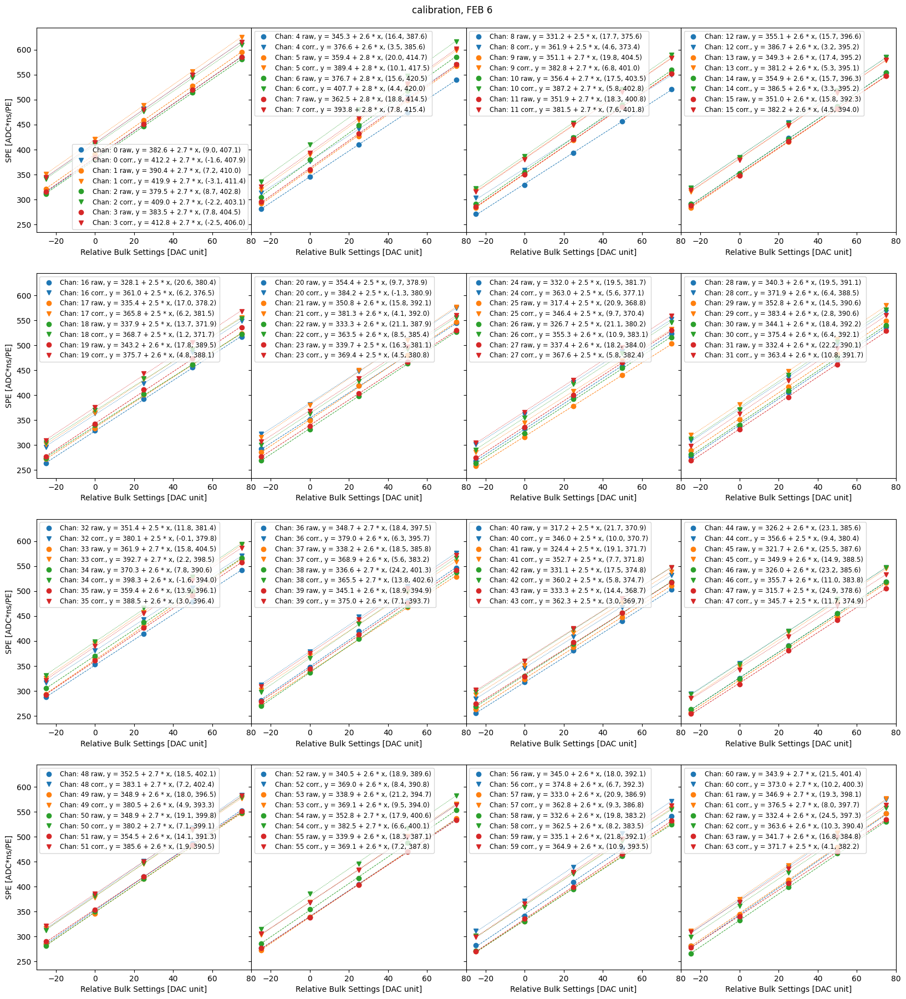

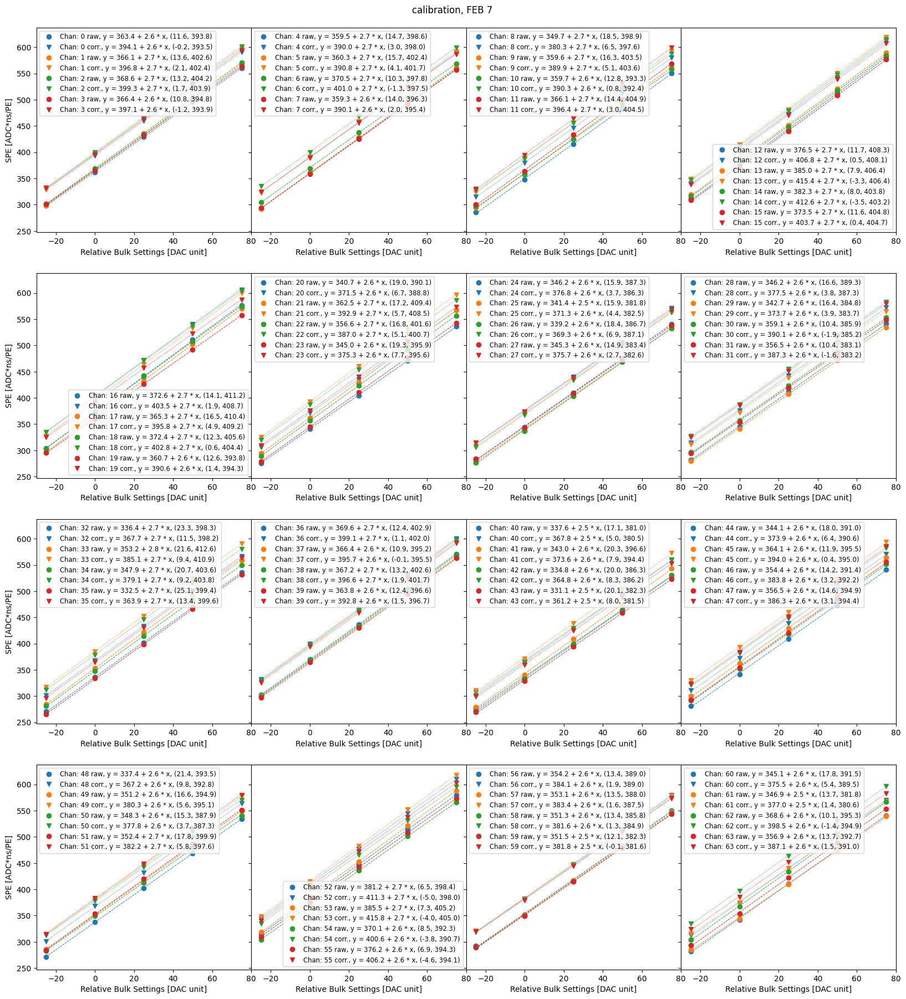

In [6]:
df = PortToDFwithBulk(fileList, filepath.datatag["bulk_scan_crvaging019"]["bulk"])
df_calib = CalibrateByScan(df)
display(df_calib)

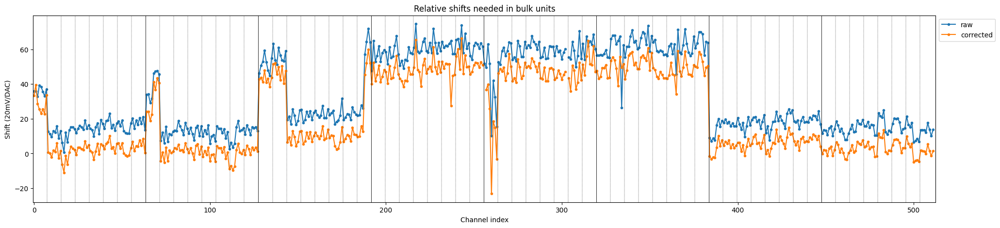

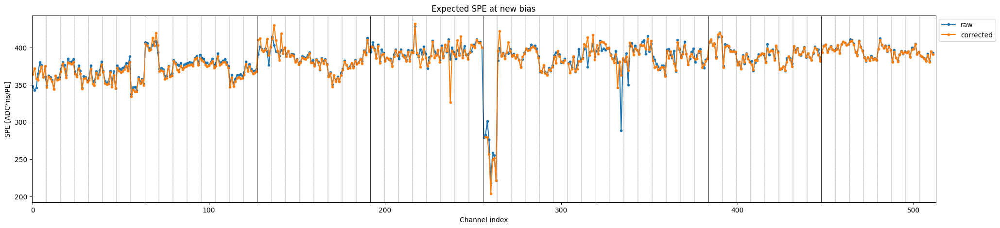

In [7]:
# check consistency
plt.figure(figsize = (24,5))
plt.plot(np.add(df_calib['FEB']*64,df_calib['ch']), df_calib['bulkRelativeSettingRaw'], '.-', label=('raw'))
plt.plot(np.add(df_calib['FEB']*64,df_calib['ch']), df_calib['bulkRelativeSettingCorr'], '.-', label=('corrected'))
plt.title("Relative shifts needed in bulk units")
plt.xlabel("Channel index")
plt.ylabel("Shift (20mV/DAC)")
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
for iFEB in range(8):
    for iAFE in range(8):
        plt.axvline(x=8*(iFEB*8+iAFE)-0.5, color='k', linestyle='-'if iAFE==0 else '--', linewidth=0.6 if iAFE==0 else 0.3)
plt.gca().set_xlim(-0.5, 8*64+0.5)
plt.show()

plt.figure(figsize = (24,5))
plt.plot(np.add(df_calib['FEB']*64,df_calib['ch']), df_calib['SPErefRaw'], '.-', label=('raw'))
plt.plot(np.add(df_calib['FEB']*64,df_calib['ch']), df_calib['SPErefCorr'], '.-', label=('corrected'))
plt.title("Expected SPE at new bias")
plt.xlabel("Channel index")
plt.ylabel("SPE [ADC*ns/PE]")
plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
for iFEB in range(8):
    for iAFE in range(8):
        plt.axvline(x=8*(iFEB*8+iAFE)-0.5, color='k', linestyle='-'if iAFE==0 else '--', linewidth=0.6 if iAFE==0 else 0.3)
plt.gca().set_xlim(-0.5, 8*64+0.5)
plt.show()

In [9]:
def UpdateSettings(originalSettingsFiles, outputSettingsFiles, df_calib, useCorr = True, AFEmask = 0xff):
    FEBs = df_calib['FEB'].unique()
    FEBs = np.sort(FEBs)

    for FEB in FEBs:
        print("FEB%i"%FEB)
        myFilename = os.path.join(settings_dir, originalSettingsFiles[FEB])
        mySettings = settings_file.settingsFile(myFilename)
        print("before change")
        mySettings.Print()
        for chan in range(64):
            df_calib_ = df_calib.query("FEB==%i & ch==%i"%(FEB, chan)).reset_index()
            # display(df_calib_)
            if df_calib_ is not None and len(df_calib_.index)>0:
                adjustment = df_calib_['bulkRelativeSettingCorr'][0] if useCorr else df_calib_['bulkRelativeSettingRaw'][0]
                if np.isnan(adjustment):
                    mySettings.trims[chan] = 0xdead
                else:
                    mySettings.trims[chan] += int(adjustment * MV_PER_BULK / MV_PER_TRIM)
        print("no balance")
        mySettings.Print()
        mySettings.BalanceBiasTrimBulk()
        print("after change")
        mySettings.Print()
        print("\n\n\n")
        if outputSettingsFiles != None:
            mySettings.DumpToTxt(os.path.join(settings_dir, outputSettingsFiles[FEB]))
        else:
            mySettings.DumpToTxt(None, AFEmask)
    return

In [10]:
initial_settings_files = ["Settings_crvaging-012_FEB3_sync402.txt",
                          "Settings_crvaging-012_FEB7_sync402.txt",
                          "Settings_crvaging-012_FEB2_sync402.txt",
                          "Settings_crvaging-012_FEB1_sync402.txt",
                          "Settings_crvaging-012_FEB0_sync402.txt",
                          "Settings_crvaging-012_FEB6_sync402.txt",
                          "Settings_crvaging-012_FEB5_sync402.txt",
                          "Settings_crvaging-012_FEB4_sync402.txt"]
output_settings_files = ["Settings_crvaging-019_FEB%i_sync402.txt"%i for i in range(8)]

UpdateSettings(initial_settings_files, output_settings_files, df_calib, True) # used corrected to 20 degC

FEB0
before change
BULK| TRIM                           |GAIN
----+--------------------------------+----
A80 |7FC 839 7DE 7EC 829 7F1 7E2 806 |384
A71 |812 7F9 7D8 7F1 802 80B 810 80E |384
AA8 |80B 806 7FD 7FF 7FE 80C 7FC 80B |384
A7A |805 80B 7EF 7ED 814 7FE 7FF 7ED |384
A86 |7F4 7EA 7EF 80B 81A 803 823 805 |384
A73 |7FA 81A 7FC 818 80A 7FB 7DF 7FC |384
A71 |819 805 7FA 807 80D 7E7 7FC 7EF |384
A94 |81D 7FD 7D7 7F4 818 7FE 805 7FE |384
no balance
BULK| TRIM                           |GAIN
----+--------------------------------+----
A80 |6AF 6AD 6C0 6EE 742 6F3 6FE 6B7 |384
A71 |80C 7F7 7EE 7DF 7F9 7D0 82C 800 |384
AA8 |84B 873 80B 83F 7F6 7E3 7DE 7F5 |384
A7A |80B 7E9 7CC 7D2 800 7B7 7DD 7BC |384
A86 |7E6 7E3 813 7FF 7E1 807 7EC 7D7 |384
A73 |7E0 7E0 7BA 7B3 7EC 7D5 7DF 7C3 |384
A71 |7DD 7E8 7BE 806 818 7F6 806 7D0 |384
A94 |7DA 7EF 7AD 7CD 7CA 7D0 7B0 7FA |384
after change
BULK| TRIM                           |GAIN
----+--------------------------------+----
A9D |7D1 7CF 7E2 810 864 81